In [1]:
import cv2 as cv
import numpy as np
from skimage.util import random_noise
from matplotlib import pyplot as plt

In [16]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100 # 200 e.g. is really fine, but slower

In [17]:
img = cv.imread('test.png')

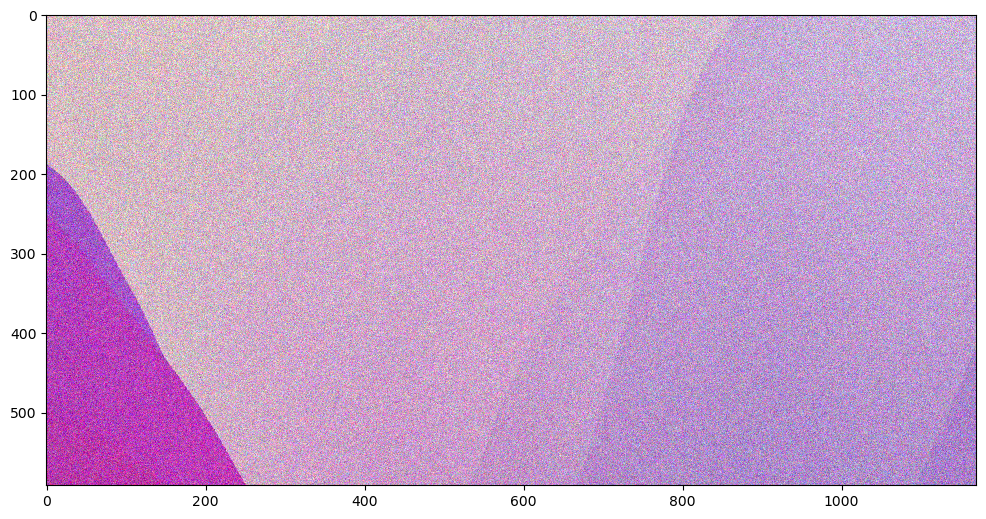

In [27]:
noised = random_noise(img, 'gaussian', clip=True, mean=0.0, var=0.01)
plt.imshow(noised, interpolation='nearest')
plt.show()

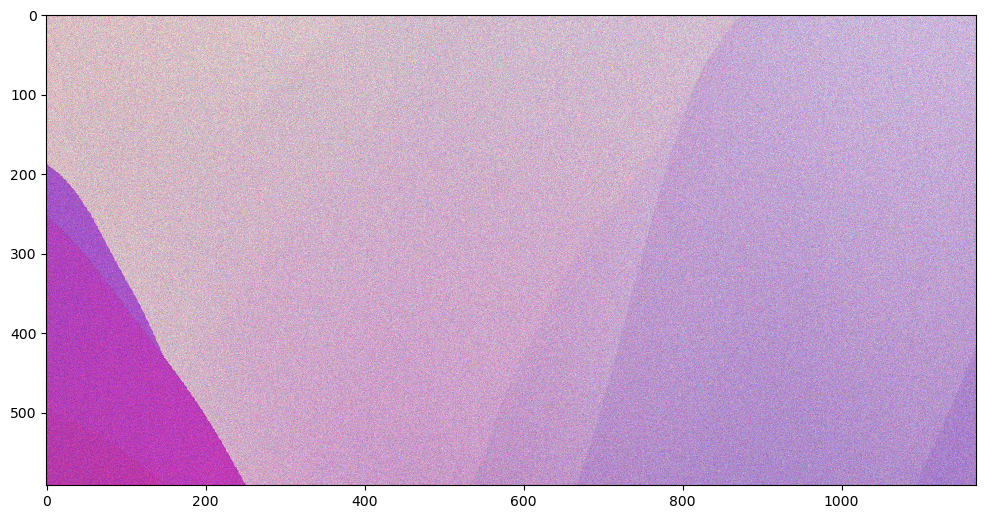

In [20]:
noised = random_noise(img, 'poisson', clip=True)
plt.imshow(noised, interpolation='nearest')
plt.show()

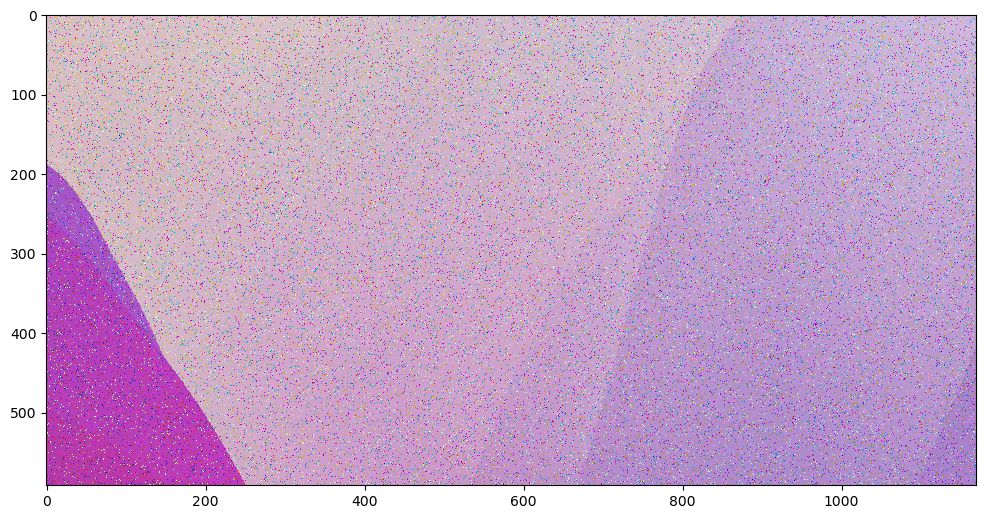

In [21]:
noised = random_noise(img, 's&p', amount=0.05, salt_vs_pepper=0.5, clip=True)
plt.imshow(noised, interpolation='nearest')
plt.show()

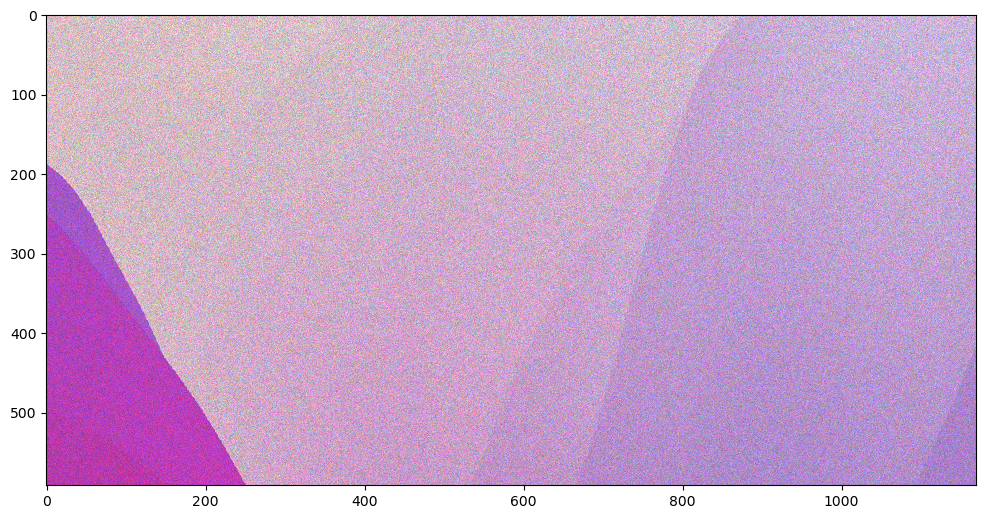

In [22]:
noised = random_noise(img, 'speckle', mean=0.0, var=0.01, clip=True)
plt.imshow(noised, interpolation='nearest')
plt.show()

In [3]:
from datasets.VQADataset import VQADataset

In [4]:
data = VQADataset(question_file='.data/questions.json', annotation_file='.data/anns.json', img_dir='', img_feat_dir='')

100%|██████████| 214354/214354 [01:00<00:00, 3530.15it/s]


In [26]:
data[0].question_tokenized

['where', 'is', 'he', 'looking']

In [5]:
data[0].answers

{'down': 1, 'at table': 0.3, 'skateboard': 0.3, 'table': 0.3}

In [1]:
import nltk
from nltk.corpus import wordnet

In [3]:
words = ['where', 'is', 'he', 'looking']

In [26]:
import nltk;
nltk.download('popular') 
from nltk.corpus import wordnet as wn

def get_synonyms(word, pos):
  ' Gets word synonyms for part of speech '
  for synset in wn.synsets(word, pos=pos_to_wordnet_pos(pos)):
    for lemma in synset.lemmas():
        yield lemma.name()

def pos_to_wordnet_pos(penntag, returnNone=False):
    morphy_tag = {'NN':wn.NOUN, 'JJ':wn.ADJ,
                  'VB':wn.VERB, 'RB':wn.ADV}
    try:
        return morphy_tag[penntag[:2]]
    except:
        return None if returnNone else ''

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /home/users2/vaethdk/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /home/users2/vaethdk/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /home/users2/vaethdk/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /home/users2/vaethdk/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /home/users2/vaethdk/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /home/users2/vaethdk/nltk_data...
[nltk_dat

In [29]:
# Tokenize text
text = nltk.word_tokenize("Where is he looking?")

for word, tag in nltk.pos_tag(text):
  print(f'word is {word}, POS is {tag}')

  # Filter for unique synonyms not equal to word and sort.
  unique = sorted(set(synonym for synonym in get_synonyms(word, tag) if synonym != word))

  for synonym in unique:
    print('\t', synonym)

word is Where, POS is WRB
word is is, POS is VBZ
	 be
	 comprise
	 constitute
	 cost
	 embody
	 equal
	 exist
	 follow
	 live
	 make_up
	 personify
	 represent
word is he, POS is PRP
word is looking, POS is VBG
	 appear
	 attend
	 await
	 bet
	 calculate
	 count
	 depend
	 expect
	 face
	 front
	 look
	 reckon
	 search
	 see
	 seem
	 take_care
	 wait
word is ?, POS is .


In [2]:
from PyDictionary import PyDictionary

dictionary=PyDictionary()

In [7]:
for word in words:
    print('---')
    print(word, dictionary.synonym(word))

---
where has no Synonyms in the API
where None
---
is ['act', 'stagnate', 'account', 'buy', 'hang around', 'mope', 'need', 'confound', 'kill', 'put out', 'feel', 'loiter', 'relate', 'suck', 'hum', 'befuddle', 'hail', 'compare', 'yawn', 'hang', 'stay', 'adorn', 'specify', 'incline', 'be well', 'curve', 'come in for', 'incarnate', 'bedevil', 'translate', 'turn out', 'number', 'cover', 'work', 'iridesce', 'hurt', 'add up', 'swim', 'body forth', 'run', 'suit', 'hoodoo', 'cut across', 'consist', 'footle', 'seethe', 'cut', 'deck', 'suffer', 'sparkle', 'lallygag', 'cohere', 'owe', 'balance', 'represent', 'seem', 'distribute', 'trim', 'measure', 'substantiate', 'bake', 'moon about', 'take', 'point', 'disaccord', 'delimit', 'define', 'litter', 'shine', 'remain', 'fox', 'range', 'lollygag', 'squat', 'moon around', 'grace', 'twist', 'beautify', 'make sense', 'coruscate', 'tarry', 'stand', 'loaf', 'accept', 'terminate', 'scintillate', 'retard', 'gravitate', 'end', 'tend', 'wash', 'jumble', 'beat'

In [1]:
import fasttext.util
fasttext.util.download_model('en', if_exists='ignore')
ft = fasttext.load_model('cc.en.300.bin')

In [2]:
dir(ft)

['__class__',
 '__contains__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_labels',
 '_words',
 'f',
 'get_analogies',
 'get_dimension',
 'get_input_matrix',
 'get_input_vector',
 'get_label_id',
 'get_labels',
 'get_line',
 'get_meter',
 'get_nearest_neighbors',
 'get_output_matrix',
 'get_sentence_vector',
 'get_subword_id',
 'get_subwords',
 'get_word_id',
 'get_word_vector',
 'get_words',
 'is_quantized',
 'labels',
 'predict',
 'quantize',
 'save_model',
 'set_args',
 'set_matrices',
 'test',
 'test_label',
 'words']

In [8]:
for word in words:
    print('-----')
    print(word)
    print(ft.get_nearest_neighbors(word, k=5))

-----
where
[(0.6255130171775818, 'whre'), (0.6202252507209778, 'that'), (0.6172757148742676, 'wher'), (0.6160352230072021, 'wherer'), (0.606401801109314, 'when')]
-----
is
[(0.6868757605552673, 'It'), (0.6245827078819275, 'be'), (0.6082090735435486, 'This'), (0.6053867340087891, "'s"), (0.5775883793830872, 'Is')]
-----
he
[(0.8532803058624268, 'He'), (0.6434878706932068, 'it-he'), (0.6158631443977356, 'him'), (0.5929179787635803, 'it'), (0.5914342403411865, 'she')]
-----
looking
[(0.763883650302887, 'loooking'), (0.7278639078140259, 'lookng'), (0.7124635577201843, 'looing'), (0.688562273979187, 'lloking'), (0.6879180073738098, 'Looking')]


In [6]:
help(ft.get_nearest_neighbors)

Help on method get_nearest_neighbors in module fasttext.FastText:

get_nearest_neighbors(word, k=10, on_unicode_error='strict') method of fasttext.FastText._FastText instance



In [11]:
import torch
from copy import deepcopy
a = torch.ones(5,5)
b = deepcopy(a)
b[:,:] = 0.4
print(a)
print(b)

tensor([[1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.]])
tensor([[0.4000, 0.4000, 0.4000, 0.4000, 0.4000],
        [0.4000, 0.4000, 0.4000, 0.4000, 0.4000],
        [0.4000, 0.4000, 0.4000, 0.4000, 0.4000],
        [0.4000, 0.4000, 0.4000, 0.4000, 0.4000],
        [0.4000, 0.4000, 0.4000, 0.4000, 0.4000]])


In [12]:
a = torch.rand(5,5)
a

tensor([[0.6056, 0.4944, 0.5158, 0.4949, 0.5548],
        [0.6806, 0.6611, 0.7640, 0.5461, 0.1553],
        [0.2950, 0.1974, 0.4733, 0.6399, 0.3298],
        [0.7661, 0.9361, 0.6138, 0.2470, 0.8235],
        [0.1738, 0.8911, 0.4817, 0.8661, 0.0318]])

In [15]:
a.min(dim=-1)

torch.return_types.min(
values=tensor([0.4944, 0.1553, 0.1974, 0.2470, 0.0318]),
indices=tensor([1, 4, 1, 3, 4]))

In [14]:
torch.minimum(a,b)

tensor([[0.4000, 0.4000, 0.4000, 0.4000, 0.4000],
        [0.4000, 0.4000, 0.4000, 0.4000, 0.1553],
        [0.2950, 0.1974, 0.4000, 0.4000, 0.3298],
        [0.4000, 0.4000, 0.4000, 0.2470, 0.4000],
        [0.1738, 0.4000, 0.4000, 0.4000, 0.0318]])

In [18]:
a = torch.rand(2,3,2)
b = torch.rand(2,3,2)
print(a)
a.min(dim=0)[0]

tensor([[[0.7828, 0.1023],
         [0.8545, 0.3100],
         [0.8034, 0.4818]],

        [[0.1972, 0.8024],
         [0.2047, 0.0457],
         [0.2472, 0.9421]]])


tensor([[0.1972, 0.1023],
        [0.2047, 0.0457],
        [0.2472, 0.4818]])

In [22]:
a = torch.rand(2,3,2)
print(a)
while len(a.size()) > 1:
    a = a.min(dim=0)[0]
print(a)

tensor([[[0.0252, 0.1240],
         [0.8800, 0.9427],
         [0.2342, 0.2030]],

        [[0.8898, 0.9935],
         [0.9526, 0.3278],
         [0.9727, 0.0793]]])
tensor([0.0252, 0.0793])
